## Exploration of image manipulation to prep for CNN

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import glob, os
from skimage import exposure
%matplotlib inline

Sample the training data

In [2]:
ALB, BET, DOL, LAG, NoF, OTHER, SHARK, YFT = {},{},{},{},{},{},{},{}
classes = [ALB, BET, DOL, LAG, NoF, OTHER, SHARK, YFT]
filepaths = ['train/ALB/*.jpg', 'train/BET/*.jpg', 'train/DOL/*.jpg', \
             'train/LAG/*.jpg', 'train/NoF/*.jpg', 'train/OTHER/*.jpg', \
             'train/SHARK/*.jpg', 'train/YFT/*.jpg']
for n, filepath in enumerate(filepaths):
    for x, f in enumerate(glob.glob(filepath)):
        if x % 15 == 0:
            classes[n][f] = plt.imread(f)
            if len(classes[n]) > 9:
                break

In [3]:
alb = ALB[ALB.keys()[np.random.randint(0,len(ALB))]]
bet = BET[BET.keys()[np.random.randint(0,len(BET))]]
dol = DOL[DOL.keys()[np.random.randint(0,len(DOL))]]
lag = LAG[LAG.keys()[np.random.randint(0,len(LAG))]]
nof = NoF[NoF.keys()[np.random.randint(0,len(NoF))]]
other = OTHER[OTHER.keys()[np.random.randint(0,len(OTHER))]]
shark = SHARK[SHARK.keys()[np.random.randint(0,len(SHARK))]]
yft = YFT[YFT.keys()[np.random.randint(0,len(YFT))]]

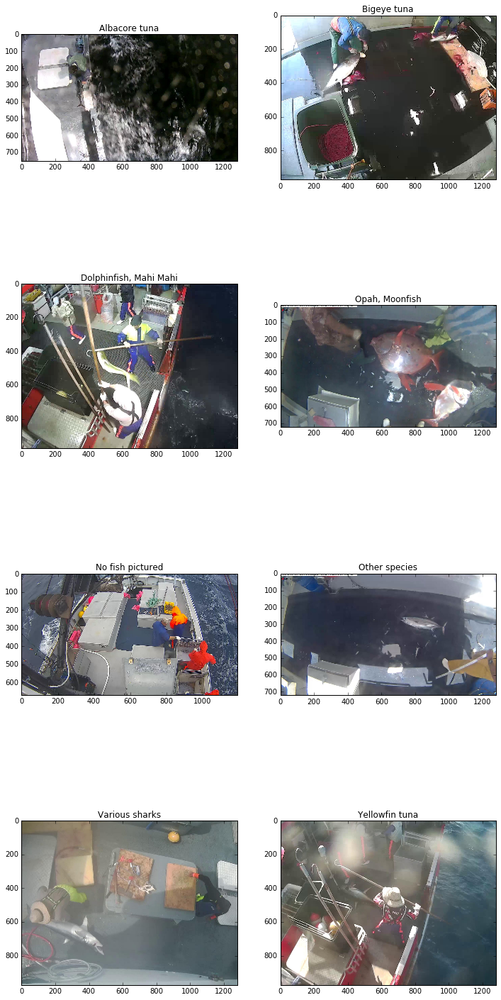

In [4]:
fig = plt.figure(figsize=(12, 26))

ax1 = fig.add_subplot(421)
ax1.set_title('Albacore tuna')
ax1.imshow(alb)

ax2 = fig.add_subplot(422)
ax2.set_title('Bigeye tuna')
plt.imshow(bet)

ax3 = fig.add_subplot(423)
ax3.set_title('Dolphinfish, Mahi Mahi')
plt.imshow(dol)

ax4 = fig.add_subplot(424)
ax4.set_title('Opah, Moonfish')
plt.imshow(lag)

ax5 = fig.add_subplot(425)
ax5.set_title('No fish pictured')
plt.imshow(nof)

ax6 = fig.add_subplot(426)
ax6.set_title('Other species')
plt.imshow(other)

ax7 = fig.add_subplot(427)
ax7.set_title('Various sharks')
plt.imshow(shark)

ax8 = fig.add_subplot(428)
ax8.set_title('Yellowfin tuna')
plt.imshow(yft)

Adjust the night vision photos to look more like the others. Compare the relationship between color channels of the daytime images and the night vision images. Populate a list of night vision (night vision images have a larger difference in the mean values per channel) and daytime matrices of pixels per channel, and keep a list of the original images for reference. A 2D histogram reveals the relationship better than a scatter plot, due to the amount of data.

In [5]:
nv = []
dt = []
nv_mats = []
dt_mats = []
for d in classes:
    for im in d.itervalues():
        h, w, ch = im.shape
        im2 = im.reshape(h*w, 3)
        g_less_r = np.mean(im2, axis=0)[1] - np.mean(im2, axis=0)[0]
        g_less_b = np.mean(im2, axis=0)[1] - np.mean(im2, axis=0)[2]
        if g_less_r > 25 or g_less_b > 25:
            nv_mats.append(im2)
            nv.append(im)
        else:
            if len(dt_mats) > 12:
                continue
            else:
                dt_mats.append(im2)
                dt.append(im)

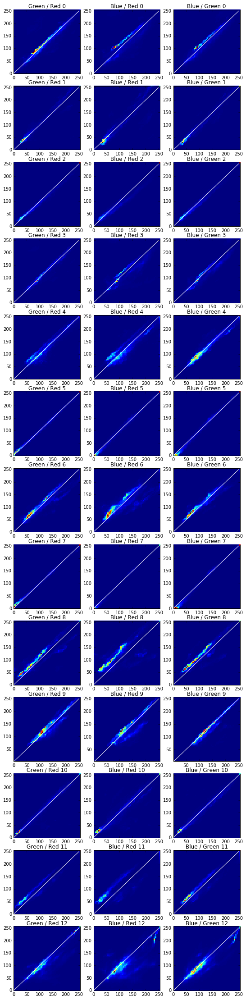

In [6]:
fig = plt.figure(figsize=(9, 3*13))

for n, mat in enumerate(dt_mats):
    ax = plt.subplot(13, 3, n*3+1)
    plt.hist2d(mat[:,0],mat[:,1],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Green / Red '+str(n))
    
    ax = plt.subplot(13, 3, n*3+2)
    plt.hist2d(mat[:,0],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Red '+str(n))
    
    ax = plt.subplot(13, 3, n*3+3)
    plt.hist2d(mat[:,1],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Green '+str(n))

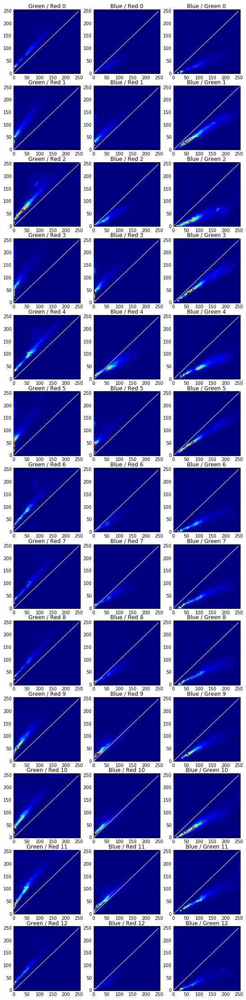

In [7]:
fig = plt.figure(figsize=(9, 3*13))

for n, mat in enumerate(nv_mats):
    ax = plt.subplot(13, 3, n*3+1)
    plt.hist2d(mat[:,0],mat[:,1],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Green / Red '+str(n))
    
    ax = plt.subplot(13, 3, n*3+2)
    plt.hist2d(mat[:,0],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Red '+str(n))
    
    ax = plt.subplot(13, 3, n*3+3)
    plt.hist2d(mat[:,1],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Green '+str(n))

Daytime image's color channels correlate roughly 1:1. Night vision image's color channels are directly coorelated but not exaclty 1:1. There are two types of night vision images. Indices [0, 2, 4, 6, 7, 8, 12] all share a similair relationship, while indices [1, 3, 5, 9, 10, 11] all share another similair relationship.

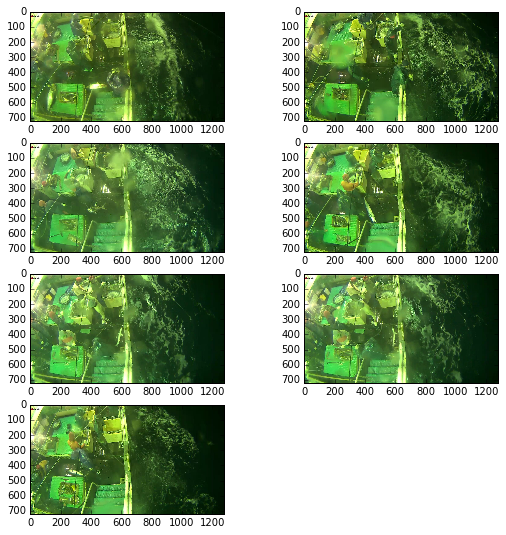

In [9]:
fig = plt.figure(figsize=(9, 9))
for n, idx in enumerate(grn_idx):
    ax = plt.subplot(4, 2, n+1)
    plt.imshow(nv[idx])

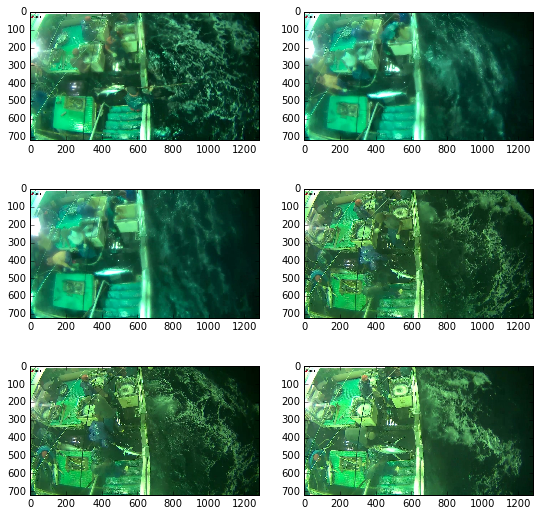

In [10]:
fig = plt.figure(figsize=(9, 9))
for n, idx in enumerate([1, 3, 5, 9, 10, 11]):
    ax = plt.subplot(3, 2, n+1)
    plt.imshow(nv[idx])

The two types are ones with intense green and the other is intense green/blue, will abbreviate them grn, and blu. Looking back at the 2D histograms of the night vision images: in general, the chart below outlines the transformations needed to correlate the color channels more similarly to the day time images, in terms of slope and intercept.

*grn* | Green/Red | Blue/Red | Blue/Green
--- | --- | ---
slope|x.8|x1.25|x2
intercept|-25||

*blu* | Green/Red | Blue/Red | Blue/Green
--- | --- | ---
slope|x.75||x1.3
intercept|-40|-25|

In [8]:
grn_idx = [0, 2, 4, 6, 7, 8, 12]
blu_idx = [1, 3, 5, 9, 10, 11]

In [11]:
nv_mats_grn = [nv_mats[idx] for idx in grn_idx]
nv_mats_blu = [nv_mats[idx] for idx in blu_idx]

In [12]:
nv_mats_grn_adj = []
nv_mats_blu_adj = []
for im in nv_mats_grn:
    im_adj = im
    im_adj[:,2] = im[:,2] * 1.6
    im_adj[:,1] = np.abs(im[:,1].astype(int) - 25).astype(np.uint8)
    im_adj[:,1] = im[:,1] * .8
    nv_mats_grn_adj.append(im_adj)
    
for im in nv_mats_blu:
    im_adj = im
    im_adj[:,1] = np.abs(im[:,1].astype(int) - 40).astype(np.uint8)
    im_adj[:,1] = im[:,1] * .75
    im_adj[:,2] = np.abs(im[:,2].astype(int) - 25).astype(np.uint8)
    nv_mats_blu_adj.append(im_adj)

Plot the transformed data to see if they are closer to a 1:1 coorelation.

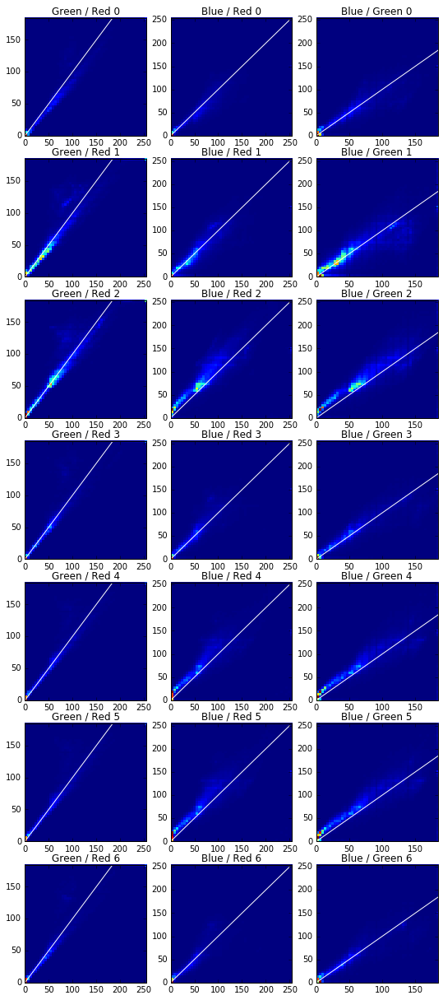

In [13]:
fig = plt.figure(figsize=(9, 21))

for n, mat in enumerate(nv_mats_grn_adj):
    ax = plt.subplot(7,3,n*3+1)
    plt.hist2d(mat[:,0],mat[:,1],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Green / Red '+str(n))
    
    ax = plt.subplot(7,3,n*3+2)
    plt.hist2d(mat[:,0],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Red '+str(n))
    
    ax = plt.subplot(7,3,n*3+3)
    plt.hist2d(mat[:,1],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Green '+str(n))

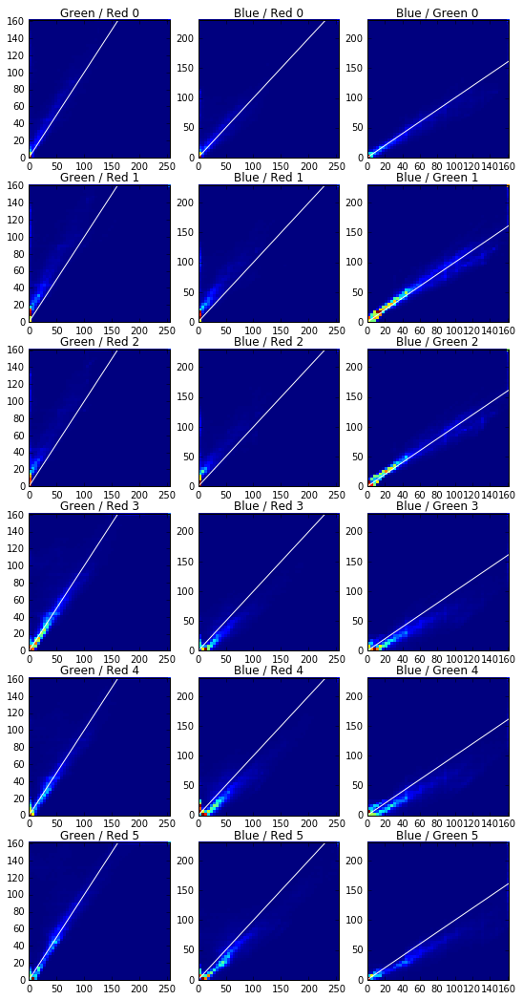

In [14]:
fig = plt.figure(figsize=(9, 18))

for n, mat in enumerate(nv_mats_blu_adj):
    ax = plt.subplot(6,3,n*3+1)
    plt.hist2d(mat[:,0],mat[:,1],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Green / Red '+str(n))
    
    ax = plt.subplot(6,3,n*3+2)
    plt.hist2d(mat[:,0],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Red '+str(n))
    
    ax = plt.subplot(6,3,n*3+3)
    plt.hist2d(mat[:,1],mat[:,2],bins=(50,50))
    plt.plot(np.linspace(0,250,100), np.linspace(0,250,100), color='white')
    plt.title('Blue / Green '+str(n))

The transfomations did not yield perfect 1:1 coorelation for the night vision image's color channels, but they will generalize well.

In [15]:
ims = []
for n, idx in enumerate(grn_idx):
    h, w, ch = nv[idx].shape
    ims.append(nv_mats_grn_adj[n].reshape(h,w,ch))
for n, idx in enumerate(blu_idx):
    h, w, ch = nv[idx].shape
    ims.append(nv_mats_blu_adj[n].reshape(h,w,ch))
for n, mat in enumerate(dt_mats):
    h, w, ch = dt[n].shape
    ims.append(mat.reshape(h,w,ch))

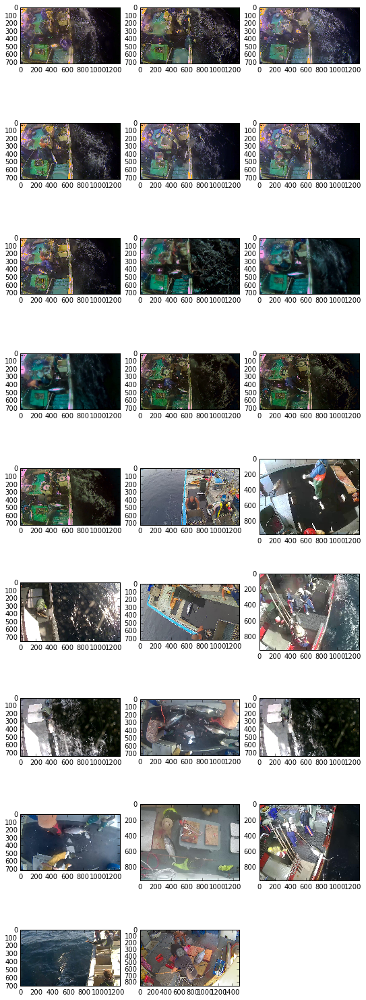

In [16]:
fig = plt.figure(figsize=(9, 27))
for n, im in enumerate(ims):
    ax = plt.subplot(9, 3, n+1)
    plt.imshow(im)

In [17]:
ims_gam = []
for im in ims:
    im_gam = exposure.adjust_gamma(im, gamma=1.2)
    ims_gam.append(im_gam)

In [18]:
ims_gam_eq = []
for im_gam in ims_gam:
    im_gam_eq = exposure.equalize_adapthist(im_gam)
    ims_gam_eq.append(im_gam_eq)

//anaconda/lib/python2.7/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


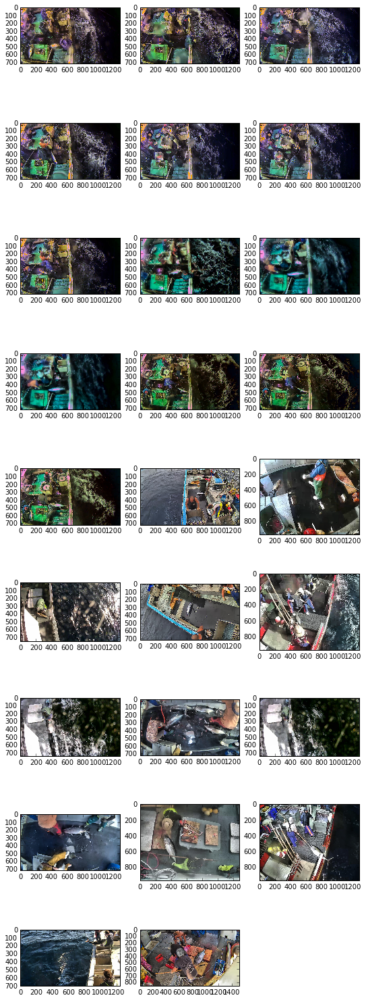

In [19]:
fig = plt.figure(figsize=(9, 27))
for n, im in enumerate(ims_gam_eq):
    ax = plt.subplot(9, 3, n+1)
    plt.imshow(im)

In [20]:
from skimage import filters

In [22]:
from skimage.color.adapt_rgb import adapt_rgb, each_channel

In [24]:
@adapt_rgb(each_channel)
def scharr_each(image):
    return filters.scharr(image)

In [28]:
ims_gam_eq_sch = []
for im_gam_eq in ims_gam_eq:
    im_gam_eq_sch = 1 - scharr_each(im_gam_eq)
    ims_gam_eq_sch.append(im_gam_eq_sch)

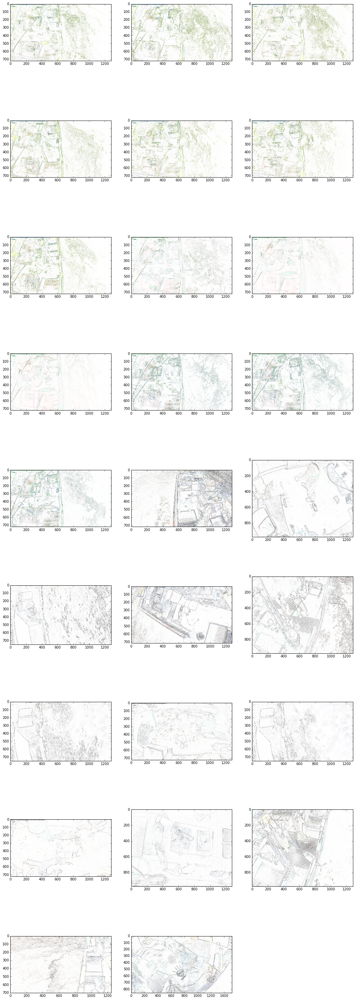

In [29]:
fig = plt.figure(figsize=(18, 54))
for n, im in enumerate(ims_gam_eq_sch):
    ax = plt.subplot(9, 3, n+1)
    plt.imshow(im)

In [39]:
ims_gam_eq_sch_eq = []
for im_gam_eq_sch in ims_gam_eq_sch:
    im_gam_eq_sch_eq = exposure.equalize_adapthist(im_gam_eq_sch)
    ims_gam_eq_sch_eq.append(im_gam_eq_sch_eq)

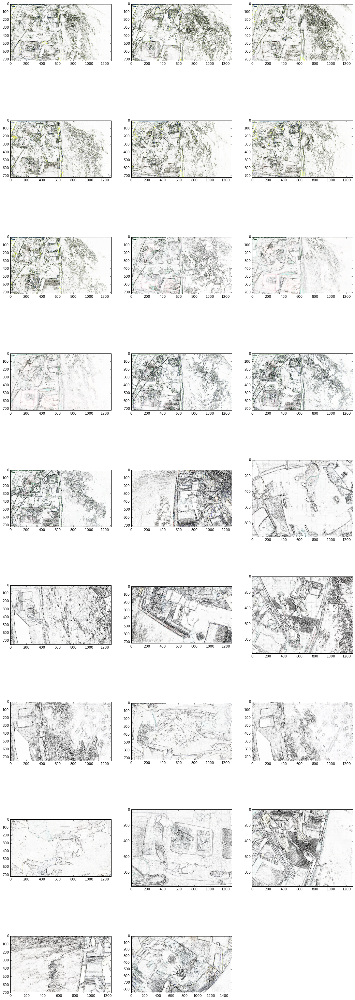

In [40]:
fig = plt.figure(figsize=(18, 54))
for n, im in enumerate(ims_gam_eq_sch_eq):
    ax = plt.subplot(9, 3, n+1)
    plt.imshow(im)